<a href="https://colab.research.google.com/github/SERVIR/curriculum_development_initiative/blob/main/2023-24/rami/fmcse/rami_module_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

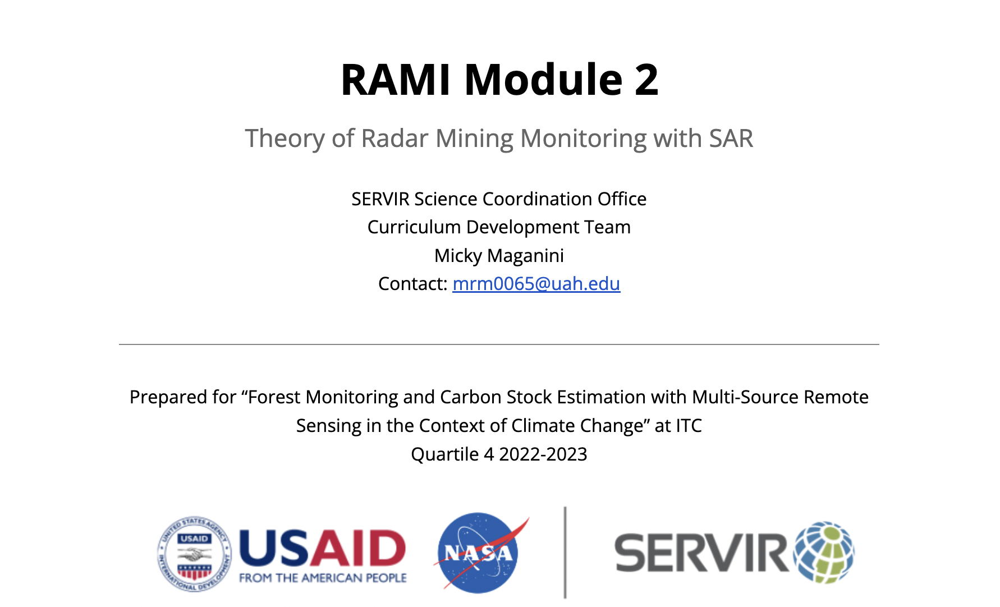

# Prerequisites and Requirements


### Requirements
For this module, you will need a...

* Computer
* Google Earth Engine Account
* Membership of the "RAMI-for-itc" Google Cloud Project.

### Prerequisites

Before taking this module, it is required that you take [RAMI Module 1](https://docs.google.com/document/d/1bzByLaxuTUxmKT1odZ_4Nu_qKyiYmCVzupTnaZaKQTc/edit?usp=sharing), which will show you how to register a Google Earth Engine account and join the "rami-for-itc" Google Cloud Project.

# Learning Objectives

By the end of this module, you will...


* Understand the difference between passive and active remote sensors.
* Understand why we may want to use active sensors instead of passive sensors and vice versa.  
* Be familiar with the Madre de Dios study area
* Understand the characteristic SAR backscatter for both forested regions as well as regions where alluvial gold mining is occuring.
* Be able to visualize SAR images in Google Colab via the `geemap` package.  

---

# IMPORTANT: Make a Copy of This Notebook

Towards the top of this page, click **File** --> **Save a copy** in Drive in order to make a personal copy of this notebook. You can then follow along in your personal notebook for the rest of the module and play around with the code as you wish. Click **File** --> **Save** in this new notebook regularly to save your progress.

---

# **Chapter 1: Set Up**

Our first step is to install the `geemap` package using `!pip install` so that we can import datasets from Google Earth Engine and visualize them within this notebook.

In [ ]:
!pip install  geemap

4/1AbUR2VP3HwVgb_I1WKclnUmI9Jnsf0WqdG0-UDdEB2NOGQKwFnQVYM6ExsgLooking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 67.4 MB/s eta 0:00:00
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11124

Now that we have installed our packages, it's time to import them via `import` so we can use them in this notebook. Below you can find a brief description of what each package does.

* The `geemap` package will allow us to visualize a Google Maps interface interactively within this notebook.
* The `ee` package will allow us to run Earth Engine functions via the python programming language.

In [ ]:
import geemap
import geemap.colormaps as cm
import ee

Now, we have to authenticate and initialize earth engine. Before running the code below, [click here](https://docs.google.com/document/d/1krJ5DU839P8vaGCHZ034bSK79I4tj1yDtpKFXzlyFug/edit?usp=sharing) to view the supplementary material for this module. It is recommended that you have this document open in a separate window, as it will walk you through the authentication process that is triggered by running the cell below.

In [ ]:
ee.Authenticate()

ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=KKNY8vFNLCqQdf4idnQjot6Leu_V9U1I-Ckd4Zt_o0c&tc=TCOOurYyNmeYgiFzZhLskd5h8dShgK6MSdyD80X7fY4&cc=XOyxZYqYPgDzwbkjJIp0VFHf65laPOMDFQxkJEPdwUc

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AbUR2VOwFM51TtnRvNA4G8NtX0LWvB4XvmJB8Z7hX6id1vUdHzN5cDtJz7E

Successfully saved authorization token.


Next, we will run the `Map` module of `geemap` to allow us to view the earth engine interface within this notebook.

# Chapter 2: Introduction to the Ecological Problem

### Societal Impact of Deforestation in Madre de Dios

But why did SERVIR-Amazonia choose to tackle deforestation in this region specifically?

According to [Caballero et al 2018](https://www.mdpi.com/2072-4292/10/12/1903), illegal gold mining in the Amazon has led to the deforestaiton of about 1,000 $km^2$ of rainforest, affecting protected areas, indigenous communities, and sustainable management areas.

It affects indigenous communities because 6% of total indigenous land in the Amazon (14.3 million hectares) directly overlaps with mining concessions and illegal mining activities according to [this publication](https://www.wri.org/research/undermining-rights-indigenous-lands-and-mining-amazon?utm_source=twitter&utm_medium=wrigovernance&utm_campaign=socialmedia&utm_term=c31e9398-92ad-4733-9ba6-27498e7a5e97) authored by the World Resources Institute. These populations are affected due to the use of mercury to extract gold from the soil, which then enters the water and bioaccumulates up the food chain via fish.

A study by [Basu et al 2018](https://www.sciencedirect.com/science/article/abs/pii/S0048969722018861) studied 46 indigenous populations in the Amazon and found mercury levels 7.5 times higher than the background levels in the general population.

### Carbon emissions Impact of Deforestation in Madre de Dios

Beyond these disastrous health impacts, we will be focusing on the obvious ecological impact of deforestation for gold mining: Carbon Emissions. A study by [Csillik, Asner 2019](https://iopscience.iop.org/article/10.1088/1748-9326/ab639c/meta) found that in 2017 alone, deforestation in just the Madre de Dios region of the Peruvian amazon caused the equivalent of 1 million tons of carbon to be released, equivalent to the average carbon emissions of 250,000 cars per year.

You can see a visual representation of study area for this notebook (which is located in the Madre de Dios region of the Peruvian Amazon) below.

### Study Area

RAMI is used by SERVIR's Amazonia Hub to generate deforestation alerts over the Madre de Dios Region of Peru, which is shown in the figure below.

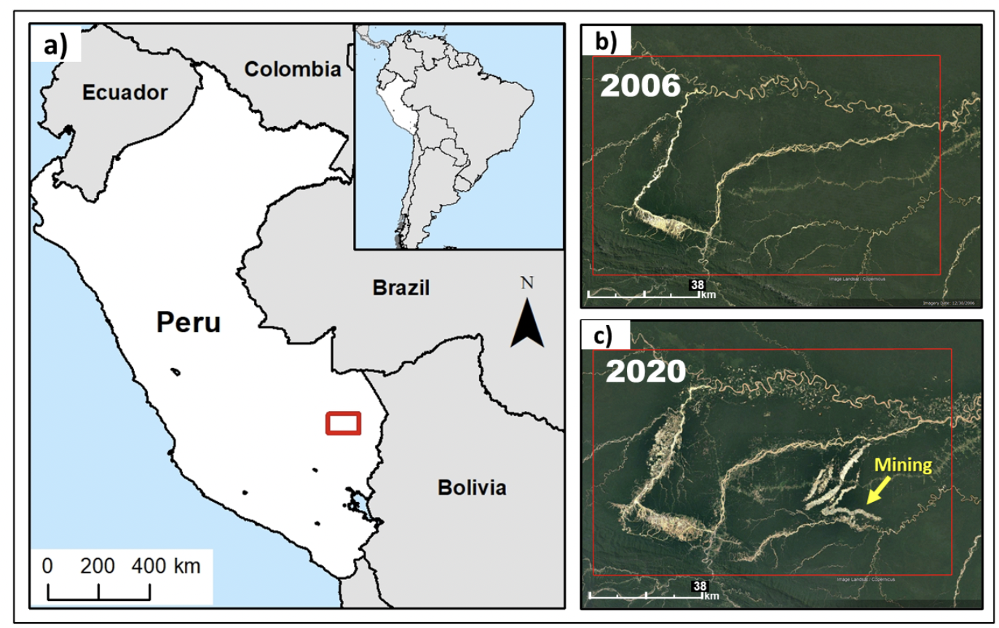

**Figure 2: Maps of the (a) area of study in the southern Peruvian Amnazon, and the expansion of alluvial mining activity between (b) 2006 and (c) 2020**

Image Credit: Cloud-Based Remote Sensing with Google Earth Engine: Fundamentals and Applications. Chapter A1.8.

Let's visualize our Area of interest using the `geemap` package we imported earlier.


First, we will initialize the Map Module.

In [ ]:
_ = geemap.Map()

Next, we will define our area of interest using a pre-existing Feature Collection. We can then print this feature collection to the console, which will show us how our data is stored in Earth Engine.

In [ ]:
# Define a variable called roi, which will be our region of interest.
roi = ee.FeatureCollection('projects/gee-book/assets/A1-8/mdd')

#print roi to the console
roi

Click on the expander arrow(▹) above to expand the list and view its content. Now click on the expander arrows (▹) next to the text that says **"features"**. Finally, click the expander arrow next to the text that says **"geometry"** to see the geographic coordinates that constitute our study area.

Now we will convert our region of interest to an Earth Engine object so we can visualize the boundary of our study area. To do this, we will first create an empty image using the `byte` method in Google Earth Engine (GEE), then use the `paint` method to draw a polygon representing our study area.  

In [ ]:
# Create an empty image.
empty = ee.Image().byte()

# Use the paint method to draw a rectangle around our area of interest
aoiOutline = empty.paint(
    featureCollection=roi,
    color=1,
    width=2
)

#Define some visualization parameters
vp = {
    'palette': 'red'
}

In [ ]:
# Center our map on the Madre de Dios region, and specify a zoom level of 10.
Map = geemap.Map(center=(-12.8, -70.1), zoom=10)

# Add the outline of our region of interest to the map
Map.setOptions('SATELLITE')
Map.addLayer(aoiOutline, vp, 'Area of Interest')

Map

Map(center=[-12.8, -70.1], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

# Chapter 3: Introduction to Synthetic Aperture Radar (SAR)

In this notebook, we will explore how we can use Synthetic Aperture Radar, also known as SAR, to identify locations where illegal gold mining is occuring in the Amazon Rainforest.

SAR is an active sensor system that transmits a chirp (an encoded burst) of electromagnetic radiation, then measuring the return signal, also known as backscatter.

The wavelength of SAR signals are on the order of centimeters.

The strength of the backscatter is partially based upon the relative roughness of the imaged surface. The rougher the surface, the stronger the backscatter, as shown below in Figure 1. We represent a strong backscatter (i.e. return signal) with a white pixel, where no backscatter will be represented by a black pixel. This will be important later as we seek to identify areas where gold mining is occuring in the Amazon

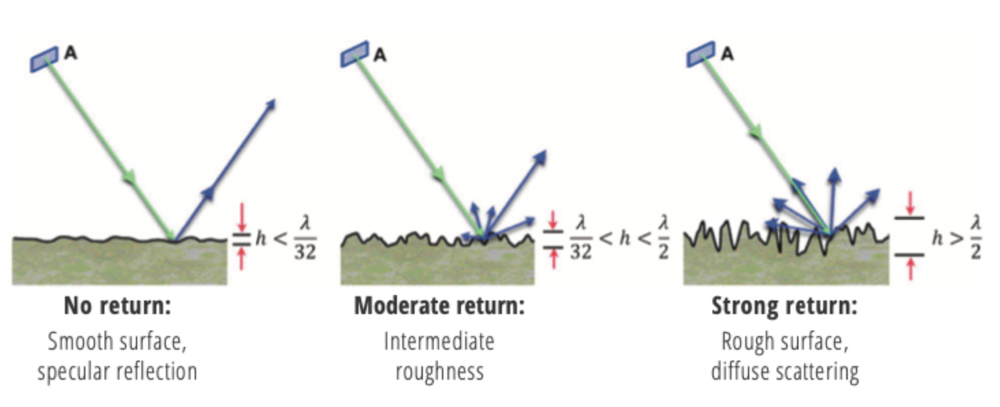

**Figure 1: Amount of backscatter depending on the surface's roughness.**

Image Credit: Alaska Satellite Facility

Now let's get a SAR Image from August of 2020. We will use ESA's Sentinel-1 SAR Ground Range Detected Dataset. This data is stored in Earth Engine in two formats: logarithmic scale (dB) and the original values. For more information on the scale of SAR data, visit [Alaska Satellite Facility's Introduction to SAR webpage](https://hyp3-docs.asf.alaska.edu/guides/introduction_to_sar/) (scroll to the bottom of the page to view the section on SAR scale).

We will use the original values due to the fact that mathematical operations (like the ones used by RAMI) should not be applied to data that follows a logarithmic scale.

This data has already been preprocessed, including updating the orbit metadata, removal of border and thermal noise, radiometric calibration, and terrain correction.

In [ ]:
# Define a time period of interest, GEE uses the "YYYY-MM-dd" date format
start_date = "2020-04-01"
end_date = "2020-07-01"

# use the ee.ImageCollection method to import a dataset from GEE. In this case, we will import the Sentinel 1 Ground Range Detected Dataset
s1_collection = ee.ImageCollection('COPERNICUS/S1_GRD_FLOAT')

# Spatially filter the dataset to our region of interest using the GEE method "filterBounds"
s1_spatial = s1_collection.filterBounds(roi)

# Temporally Filter the dataset to our time period of interest using the GEE method "filterDate"
s1_temporal = s1_spatial.filterDate(start_date, end_date)

# Get the first image from the image collection for visualization purposes using the "first" method in GEE
s1_single = s1_temporal.first()

# Clip the image to the region of interest using the "clip" method and the roi variable we created earlier in the notebook.
s1_clipped = s1_single.clip(roi)

Now let's set some visualization parameters for this image and add it to our map. Visualization parameters consist of the bands we want to use in our image, and other values we will discuss later. In the case of optical imagery, these bands constitute different colors (or different bands of radiation outside the visible spectrum such as near-infrared radiation).

In the case of Sentinel-1 SAR Data, all of our data is collected from the same portion of the electromagnetic spectrum -- the microwave region. For more information on the electromagnetic characteristics of SAR data, see [the Alaska Satellite Facility's Introduction to SAR](https://hyp3-docs.asf.alaska.edu/guides/introduction_to_sar/#sar-scale).

Although Sentinel-1 data does not have different bands like optical data, it does offer different polarizations of the electromagnetic signal it transmits. Polarization refers to the direction of travel of an electromagnetic wave. These include the polarization codes VV, VH, HV, and HH.

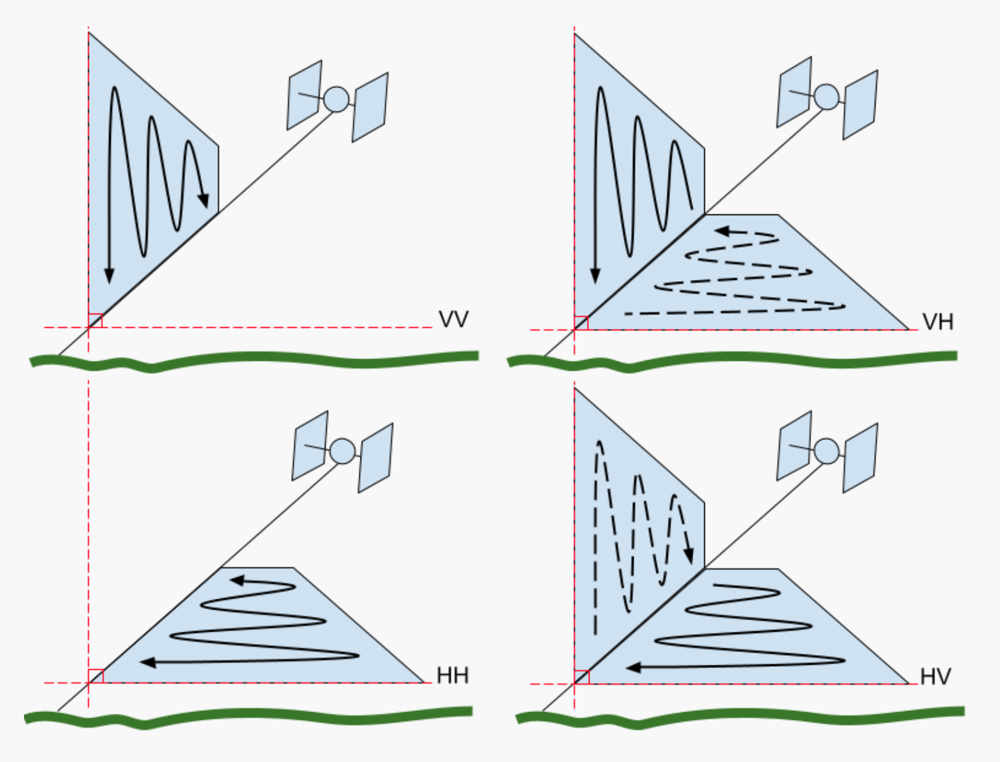

**Figure 3: Polarization States of SAR Sensors**

Image Credit: Alaska Satellite Facility

In the polarization codes shown in Figure 3 (VV, VH, HH, HV), V stands for vertical polarization, whereas H stands for horizontal polarization. The first of the two letters in the code signify the polarization of the transmitted signal, whereas the second letter symbolizes the polarization of the return signal.

Because Sentinel-1 (and SAR in general) is an active sensor system, we are able to control the polarization of both the transmitted and received signal. These different polarization modes are important because different kinds of surfaces scatter different polarization modes stronger than other polarization modes.

For the Sentinel-1 dataset within GEE, we are able to select between VV or VH polarization modes.



The Earth's surface is often approximated by remote sensing scientists as having three different types of scattering surfaces, as shown in Figure 4 below.

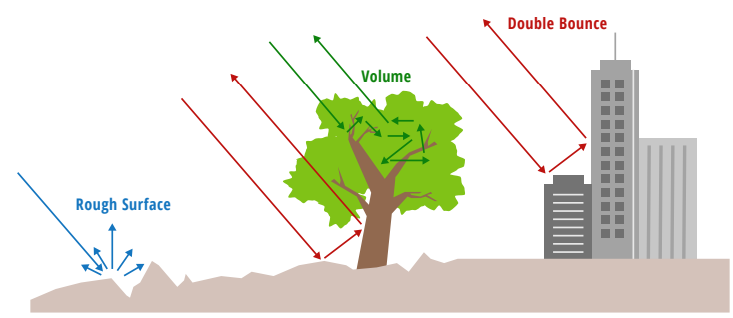

**Figure 4: Schematic Sketch of the three main scattering types for SAR data**

Image Credit: SERVIR SAR Handbook

The different scattering types displayed in Figure 4 reflect different polarization modes in different ways, as displayed by Figure 5 below.

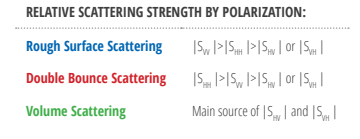

**Figure 5: Relative Scattering Strength By Polarization**

Image Credit: SERVIR SAR Handbook

Aside from selecting the polarization mode, we can also set a minimum and maximum value, as well as a gamma value when specifying our visualization parameters. Gamma refers to the degree of contrast between the values of a raster. By applying a gamma correction, you can control the overall brightness of an image. For more information about gamma, visit [the ArcGIS Pro documentation regarding the Stretch Fucnction](https://pro.arcgis.com/en/pro-app/latest/help/analysis/raster-functions/stretch-function.htm) and scroll down to the **Gamma** section.

Let's create some visualization parameters for two different polarazation modes to observe some differences between them.

In [ ]:
# Create visualization parameters for the VV polarization
vv_params = {
    'bands': ['VV'],    # Select the VV polarization
    'min': 0,           # Set a minimum value of 0
    'max': 1,           # Set a maximum value of 1
    'gamma': 1.5        # Set our gamma value.
}


# Create visualization parameters for the VH polarization
vh_params = {
    'bands': ['VH'],   # Select the VH polarization
    'min': 0,
    'max': 1,
    'gamma': 1.5
}

Now we are ready to visualize our image that we named "`s1_clipped`". We can do this using the `addLayer` method of the `geemap` package we imported at the beginning of this notebook. This method takes three arguments, and the order that we give the arguments to the method matters. The first argument we must give to the method is the image we want to display, followed by the visualization parameters we want to use to display that image. Finally, we will include a descriptive name for this layer as a string (a string is simply text enclosed in quotation marks [e.g. 'My Layer']).

In this case, we will add the same image twice, but use different parameters, so we may view the difference between the VV and VH backscatter over the Madre de Dios region.

In [ ]:
Map = geemap.Map(center=(-12.8, -70.1), zoom=10)                 # Set the center of the map to a latitude of -12.8, and a longitude of -70.1, which is centered over our study area

# Add the outline of our region of interest to the map
Map.setOptions('SATELLITE')
Map.addLayer(s1_clipped, vv_params, 'VV')
Map.addLayer(s1_clipped, vh_params, 'VH')

Map

Map(center=[-12.8, -70.1], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

# Exercise 1: VV or VH

Hover over the 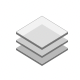 icon towards the top right of the map interface, clicking the check box next to different layers to turn them on and off, then answer the following questions.

1a. What differences, if any, can you observe between the VV polarization image and the VH polarization image?

1b. Based on these differences, which polarization mode do you think would be better for monitoring areas where alluvial gold mining may be occurring?

In [ ]:
#@title Exercise 1 Solution (Click "Show Code" below to see answer)

# 1a. The VV image shows more contrast than the VH image, with the forested areas showing brighter in the VV than in the VH image.
# 1b. Based on this higher contrast, the VV image would make it easier to identify change as there is a larger difference between
# the brightness values of water and forested areas.



---
# Chapter 4: SAR vs. Optical

You may be asking yourself, what is the point of Synthetic Aperture Radar data? It seems like a lot of trouble to go through when we could just use an optical image, right?

Let's take a look at why SERVIR Amazonia decided to use SAR instead of optical imagery to monitor Gold Mining in the study area we observed in Chapter 2.

Let's get some optical imagery over our region of interest.



In [ ]:
# Import the Landsat 8 collection, naming it as "l8_col"
l8_col = ee.ImageCollection("LANDSAT/LC08/C02/T1_TOA")

# Define a more specific region of interest to filter our image collection to, using the ee.Geometry.Rectangle method.
roi_v2 = ee.Geometry.Rectangle([-70.59454, -13.0985, -70.41052, -12.94869])

# Define a start and end date
start_date_v2 = "2020-03-01"
end_date_v2 = "2020-09-01"

# Filter the data spatially (using the filterBounds method), defining it as a new variable called l8_spatial
l8_spatial = l8_col.filterBounds(roi_v2)

# Filter the data temporally (using the filterDate method), defining it as a new variable called l8_temporal
l8_temporal = l8_spatial.filterDate(start_date_v2, end_date_v2)

Now we have an image collection spanning the spring and summer of 2020 over the Madre de Dios region. We can create an animation of this image collection to get an idea of how each image looks, then export it to our Google Drive.

In [ ]:
# Select B4, B3, and B2, from the available bands. These are the optical bands in Landsat 8 data.
l8_opt = l8_temporal.select(['B4','B3','B2'])

# Define a function to convert the data to 8-bit so we can export the video to drive.
def eightbit(input_image):
  return input_image.multiply(512).uint8()

# Map the function to our l8_opt image collection.
# Mapping a function simply means that we will apply a function to every image within an image collection.
l8_8bit = l8_opt.map(eightbit)

# Export the l8_8bit image collection to your Google Drive.
# This will export the animation to the Google Drive account associated with the email you used to sign up for GEE.
task = ee.batch.Export.video.toDrive(
    collection=l8_8bit,
    description='opt_MadredeDios',
    dimensions=720,
    framesPerSecond=3,
    region=roi.geometry()
)

task.start()

This will kick off an export in your Google Earth Engine, which you can see in the [GEE code editor](https://code.earthengine.google.com/) by clicking the **Tasks** button in the upper right. Once the task is complete, an animnation called 'opt_MadredeDios' will appear in your Google Drive.

It will be the same animation that appears below.

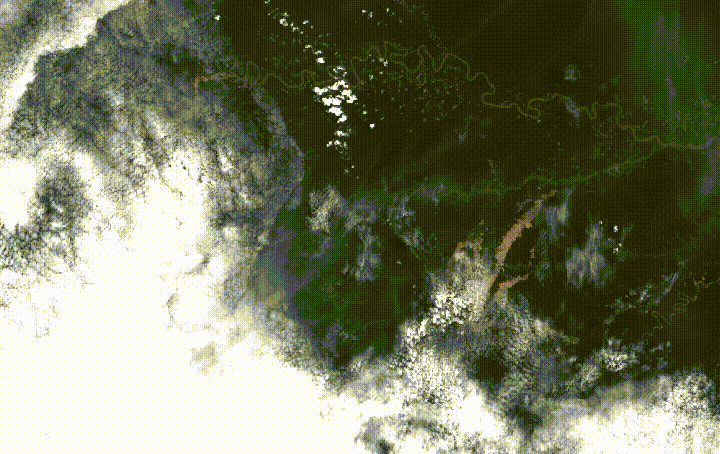

**Figure 6: Animation of Optical Imagery over the Madre de Dios Region**

As we can see, there are very few images which have no cloud cover. This is because we obtained imagery from March to September. Spring constitutes the rainy season in much of the Amazon, so this time period will often have cloud cover for our region of interest.

However, illegal gold mining in this region occurs throughout the year, regardless of weather, so SERVIR Amazonia needed a way to monitor the region rain or shine. This is where SAR comes in handy. Below you can view a SAR mosaic over the same time period, which illsutrates how SAR can "see through" the clouds. Because SAR data is collected in the microwave region of the electromagnetic spectrum, it is able to "see through" the clouds. This allows us to create deforestation alerts even through dense cloud cover.

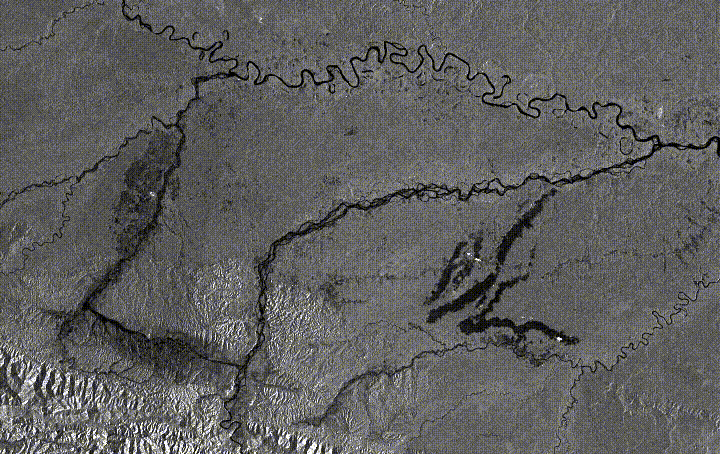

**Figure 7: Animation of Synthetic Aperture Radar (SAR) Imagery over the Madre de Dios Region**



---


# Chapter 5: SAR for Identifying Illegal Gold Mining

Now that we know why SERVIR Amazonia chose to use Sentinel-1 as their input imagery to RAMI, let's take a look at what gold mining areas look like in both optical and SAR imagery, as well as from both the ground and from above.

Let's take a look at our `s1_clipped` image, which we created earlier in the notebook. As you may recall, this image is a mosaic of Sentinel-1 imagery from April to July of 2021.

In [ ]:
box = ee.Geometry.Rectangle(
    [-70.37757, -12.6902, -69.82551, -12.53481]
)

boxOutline_v2 = empty.paint(
    featureCollection=box,
    color=1,
    width=2
)

#Define some visualization parameters
vp_v2= {
    'palette': 'blue'
}

In [ ]:
Map = geemap.Map(center=(-12.8, -70.1), zoom=10)                 # Set the center of the map to a latitude of -12.8, and a longitude of -70.1, which is centered over our study area

# Add the outline of our region of interest to the map
Map.setOptions('SATELLITE')
Map.addLayer(s1_clipped, vv_params, 'VV')
Map.addLayer(boxOutline_v2, vp_v2, 'Region 1')


Map

Map(center=[-12.8, -70.1], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

**Question 1**

Look at the image above, and then cross reference it with figure 1, shown again below, then think about the following questions:

**1a.**  Why do the dark areas in the image appear dark, and why do the lighter gray areas appear light?

**1b.** What feature do you think is present in the blue box in the image above? Looking at your answer from Question 1a, does it make sense for this surface feature to be showing as dark?

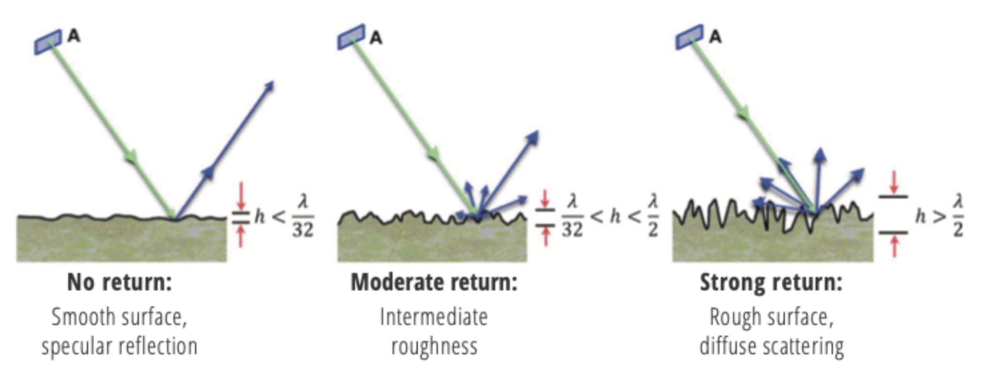

**Figure 1: Amount of backscatter depending on the surface's roughness.**

Image Credit: Alaska Satellite Facility

In [ ]:
#@title Question 1 Answer (Click "Show code" to see the solution)

# 1a. The dark areas in the image appear dark because there is no return to the surface, as shown on the left of Figure 1. Thus, we can conclude that these
# dark areas constitute smooth surfaces The lighter areas in the image appear as gray because there is a moderate or strong return to the surface, as shown on the right of figure 1.
# We can conclude that these areas have a surface with a moderate or high roughness.

#1b. The feature in the blue box in the image is a river, as we can tell from its dark appearance as well as its curvy morphology.
# The river appears dark because water creates a smooth surface (unless windblown), causing specular reflection. This reuslts
# in little to no return to the sensor, which we represent as black.


Now, let's look at the same image in question 1, but this time looking at the region within our study area highlighted by the green box.

In [ ]:
box_2 = ee.Geometry.Rectangle(
    [-70.1171, -13.001925, -69.87265, -12.7756]
)

boxOutline_v3 = empty.paint(
    featureCollection=box_2,
    color=1,
    width=2
)

#Define some visualization parameters
vp_v3= {
    'palette': 'green'
}

In [ ]:
Map = geemap.Map(center=(-12.8, -70.1), zoom=10)                 # Set the center of the map to a latitude of -12.8, and a longitude of -70.1, which is centered over our study area

# Add the outline of our region of interest to the map
Map.setOptions('SATELLITE')
Map.addLayer(s1_clipped, vv_params, 'VV')
Map.addLayer(boxOutline_v2, vp_v2, 'Region 1')
Map.addLayer(boxOutline_v3, vp_v3, 'Region 2')


Map

Map(center=[-12.8, -70.1], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

The area within the green box is an area where illegal gold mining is occuring. Expansion of gold mining from the designated "mining corridor" to the surrounding lands is what caused RAMI to be created.

Note how the backscatter signal of this area is similar to the river we identified within the blue box. This is because water is used in the mining process. Alluvial gold mining involves the removal of forest cover and topsoil, excavation, and the use of water to extract the gold from the loose sediment via the formation of mining pits. You can see an example of a mining pit shown in Figure 4 below.



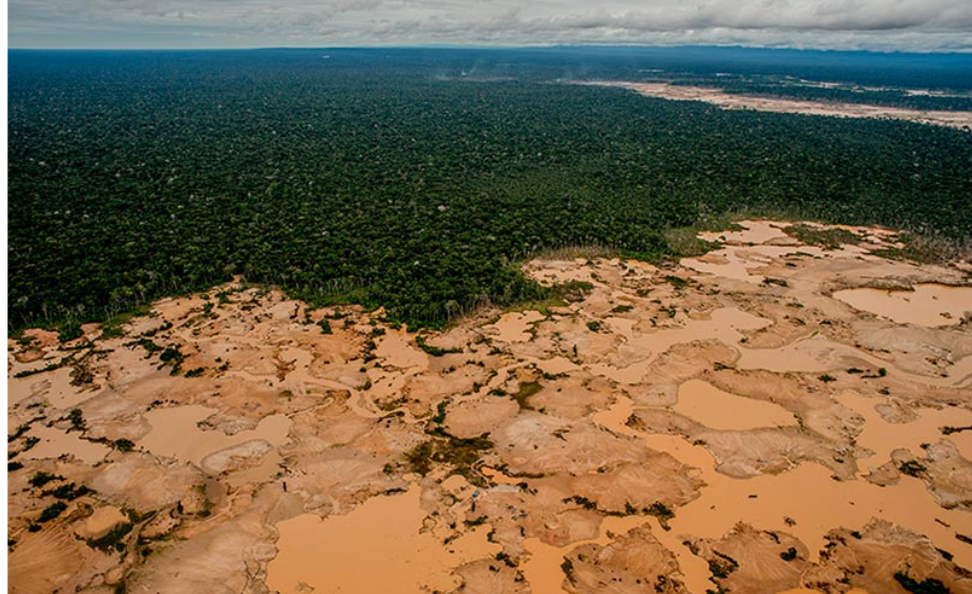

**Figure 8: An alluvial mining pit in the amazon shows how water is used in the mining process.**

Image Credit: Tomas Munita & Amazon Aid Foundation

Let's take a closer look at the area within the green box to see how mining pits appear both in the optical and SAR domain in the Madre de Dios region.

To see how mining pits in the Madre de Dios region appear in the optical domain, let's obtain Planet NICFI imagery. Planet NICFI offers free and open source moderately high resolution imagery (~ 5 meters) in the tropics.

In [ ]:
box_3 = ee.Geometry.Rectangle(
    [-70.0619, -12.9344, -70.0581, -12.9307]
)

boxOutline_v4 = empty.paint(
    featureCollection=box_3,
    color=1,
    width=4
)

#Define some visualization parameters
vp_v4= {
    'palette': 'red'
}

In [ ]:
# Use the "ee.ImageCollection" method to obtain Planet Optical Image Collection
l8_raw = ee.ImageCollection("LANDSAT/LC08/C02/T1")

# Spatially Filter the Image Collection to our study area using the 'filterBounds' method.
l8_spatial = l8_raw.filterBounds(box_2);


# Define a time period of interest before major gold mining occured in the area.
start_date_alpha = "2018-01-01"
end_date_alpha = "2018-07-01"

# Define a time period of interest closer to present day.
start_date_beta = "2023-01-01"
end_date_beta = "2023-05-01"

# This five year time difference will allow us to see how undisturbed forest looks different
# from a mining pit in both optical and SAR images.


l8_alpha = l8_spatial.filterDate(start_date_alpha, end_date_alpha)
l8_beta = l8_spatial.filterDate(start_date_beta, end_date_beta)

# Define some visualization parameters for our optical image.
# In this case, we will create a true color image, where red light is assigned to the red
# channel, green light is assigned to the green channel, and blue light is
# assigned to the blue channel.


#opt_vp = {
#    'bands': ['R', 'G', 'B'],
#    'min': 100,
#    'max': 3500,
#    'gamma': 1.5
#}

l8_vp = {
    'bands': ['B4', 'B3', 'B2'],
    'min': 0,
    'max': 200,
    'gamma': 1.5
}

composite_alpha = ee.Algorithms.Landsat.simpleComposite(
    collection = l8_alpha,
    percentile = 75,
    cloudScoreRange = 5
)

composite_beta = ee.Algorithms.Landsat.simpleComposite(
    collection = l8_beta,
    percentile = 75,
    cloudScoreRange = 5
)

# Reduce entire image collection for both time periods to a single image for each time period using the "mosaic" method in GEE.
# Then clip the images to our new area of interest using the "clip" method.
final_alpha = composite_alpha.clip(box_2)
final_beta = composite_beta.clip(box_2)

Now that we have created our optical images, let's do the same for our SAR images, using the `s1_collection` variable we defined towards the beginning of this notebook

In [ ]:
sar_spatial = s1_collection.filterBounds(box_3).select(['VV'])

sar_alpha = sar_spatial.filterDate(start_date_alpha, end_date_alpha)
sar_beta = sar_spatial.filterDate(start_date_beta, end_date_beta)

# Reduce the entire image collection for both time periods to a single image for each time period using the "mosaic" method in GEE.
# Then clip the images to our new area of interest using the "clip" method.

sar_alpha = sar_alpha.mosaic().clip(box_2)
sar_beta = sar_beta.mosaic().clip(box_2)

In [ ]:
Map = geemap.Map(center=(-12.889, -70.002), zoom=12)                 # Set the center of the map to a latitude of -12.8, and a longitude of -70.1, which is centered over our study area


# Add the outline of our region of interest to the map

Map.addLayer(sar_alpha, vv_params, 'Sentinel 1 2017')
Map.addLayer(sar_beta, vv_params, 'Sentinel 1 2023')
Map.addLayer(final_alpha, l8_vp, 'Planet 2017')
Map.addLayer(final_beta, l8_vp, 'Planet 2023')
Map.addLayer(boxOutline_v4, vp_v4, 'Region of Interest')
Map.addLayerControl()

Map

Map(center=[-12.889, -70.002], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(chi…

# Exercise 2

2a. Hover over the 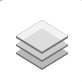 icon in the upper right corner of the map viewer and click different layers to turn them off or on. Can you notice a difference between the study region in 2017 and 2023?


2b. Using the optical (Planet) images, Note in regions where mining is occuring how there are pools of water next to exposed topsoil. Now turn the SAR images on. What can you say about the backscatter of the watery regions compared to the backscatter of the regions where there is exposed topsoil? How does the backscatter of these regions compare to the backscatter over intact forested areas? In order to answer this question, click the 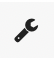 icon in the upper right corner of the map interface, then clicking on the 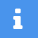. Now click within the red box on the map image. You can click different layers to visualize the values. Look specifically at the VV values for the Sentinel-1 images for 2017 and 2023. Did the values increase or decrease? Why do you think this change happened?

In [ ]:
#@title Exercise 2 Solution (Click "Show Code" to see the Solution)

#2a. Mining expanded beyond the mining corridor between 2017 and 2023

#2b. The backscatter over the water is very low (black), whereas the backscatter over the exposed topsoil is slightly stronger,
# but still weak (dark gray). The backscatter over both of these regions is much weaker than the backscatter over areas covered
# by primary forest (light gray). This is due to the fact that the topsoil in mining pits is not very rough, and thus will not
# scatter much signal back to the sensor. This is important because RAMI's change detection algorithm will look for areas where
# there is low backscatter when previously there was high backscatter, and will pick up on areas where there is either water or topsoil.

The figure below further illustrates the concept of why the backscatter signal is weaker over regions where gold mining is occurring.

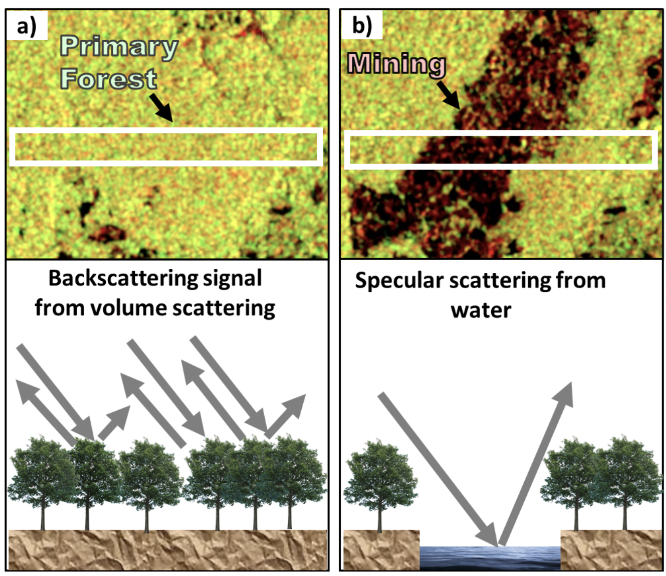

**Figure 9: RAMI Theory**

This figure shows the fundamental theory behind RAMI, wherein SAR is used to identify where illegal gold mining is occuring based on a reduction in the strength of the backscatter signal. In this figure, the SAR images have the VV polarization mode assigned to the red and blue bands, and the VH polarization mode assigned to the green bands.

Now that you know the theory behind RAMI, Module 3 will show you how we automate the process of identifying where this deforestation is occurring. Instead of manually obtaining new images on a weekly basis and manually identifying where deforestation is occurring, RAMI automates this process using a change detection algorithm.

#**Works Cited**

- Alaska Satellite Facility. “Introduction to SAR.” HyP3, https://hyp3-docs.asf.alaska.edu/guides/introduction_to_sar/. Accessed 22 May 2023.
- Basu N, Horvat M, Evers DC, Zastenskaya I, Weihe P, Tempowski J. A State-of-the-Science Review of Mercury Biomarkers in Human Populations Worldwide between 2000 and 2018. Environ Health Perspect. 2018 Oct;126(10):106001. doi: 10.1289/EHP3904. PMID: 30407086; PMCID: PMC6371716.
- Caballero Espejo J, Messinger M, Román-Dañobeytia F, et al (2018) Deforestation and forest degradation due to gold mining in the Peruvian Amazon: A 34-year perspective. Remote Sens 10:1903. https://doi.org/10.20944/preprints201811.0113.v1
- Csillik, Ovidiu & Asner, Gregory. (2020). Aboveground carbon emissions from gold mining in the Peruvian Amazon. Environmental Research Letters. 15. 014006. 10.1088/1748-9326/ab639c. S0376892901000121
- Kellendorfer, Josef. “Chapter 3: Using SAR Data for Mapping Deforestation and Forest Degradation.” The Synthetic Aperture Radar (SAR) Handbook: Comprehensive Methodologies for Forest Monitoring and Biomass Estimation , edited by Africa Ixmucane Flores-Anderson et al.
- “Stretch Function.” Stretch Function-ArcGIS Pro | Documentation, https://pro.arcgis.com/en/pro-app/latest/help/analysis/raster-functions/stretch-function.htm. Accessed 22 May 2023.
- Vallejos, P. Q., Veit, P., Tipula, P., & Reytar, K. (2020, October). Undermining Rights: Indigenous Lands and Mining in the Amazon. World Resources Institute. https://www.wri.org/publication/undermining-rights12
- Villa, Lucio, et al. “Chapter A1.8: Monitoring Gold Mining Activity Using SAR .” Cloud-Based Remote Sensing with Google Earth Engine: Fundamentals and Applications, edited by Jeffrey A Cardille et al. https://www.eefabook.org/



# Acknowledgements

RAMI was developed by SERVIR-Amazonia. The development team includes Lucio Villa, Milagros Becerra, Sidney Novoa, Osmar Yupanqui, and John Dilger.

The RAMI curriculum was organized by SERVIR’s Science Coordination Office. The modules were heavily influenced by “Chapter A1.8: Monitoring Gold Mining Activity Using SAR”  from the Open-Source Book “Cloud-Based Remote Sensing with Google Earth Engine: Fundamentals and Applications”. This chapter was written by Lucio Villa, Sidney Novoa, Milagros Becerra, Andrea Puzzi Nicolau, Karen Dyson, Karis Tenneson, and John Dilger. Special thanks to Sarah Dupont and Tomas Munita of Amazonaid for provision of photographs included in the curriculum materials

Review of the curriculum was conducted by Margarita Huesca Martinez and Michael Schlund, Kelsey Herndon, Emil Cherrington, Diana West, Katie Walker, Lauren Carey, Jacob Abramowitz, Jake Ramthun, Natalia Bermudez, Stefanie Mehlich, Emily Adams, Stephanie Jimenez, Vanesa Martin, Alex Goberna, Francisco Delgado, Biplov Bhandari, and Amanda Markert.

Sources

Development Team: https://sams.servirglobal.net/detail/10

Authorship Team: https://docs.google.com/document/d/1MIPIFMJakC6eNGOhlkXLcwjUKFyY6QJLHElzBCOfyn4/edit#heading=h.e8azr1rxmupw



